**1. Import requisite packages**

In [114]:
%pip install tqdm

  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import rasterio
import PIL
import oauthlib
import requests_oauthlib
import datetime
from rasterio.io import MemoryFile
from oauthlib.oauth2 import BackendApplicationClient
from requests_oauthlib import OAuth2Session
from PIL import Image
from datetime import datetime
import io
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import tqdm
from shapely.geometry import shape
from secrets import CLIENT_ID, CLIENT_SECRET


print("numpy:", np.__version__)
print("matplotlib:", plt.matplotlib.__version__)
print("Pillow:", PIL.__version__)
print("oauthlib:", oauthlib.__version__)
print("requests-oauthlib:", requests_oauthlib.__version__)
print("rasterio:", rasterio.__version__)
print("gpd:", gpd.__version__)
print("tqdm:", gpd.__version__)



numpy: 2.4.1
matplotlib: 3.10.8
Pillow: 12.1.0
oauthlib: 3.3.1
requests-oauthlib: 2.0.0
rasterio: 1.5.0
gpd: 1.1.2
tqdm: 1.1.2


**2. Authentication**

In [ ]:
#Define CLIENT_ID and CLIENT_SECRET
CLIENT_ID = CLIENT_ID
CLIENT_SECRET = CLIENT_SECRET

In [32]:
#Set up credentials
client = BackendApplicationClient(client_id=CLIENT_ID)
oauth = OAuth2Session(client=client)

In [33]:
#Get an authentication token
token = oauth.fetch_token(
    token_url='https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token',
    client_secret=CLIENT_SECRET,
    include_client_id=True
)

**3. Set the parameters for the image request**

In [5]:
#Pre-fire params
bbox = [-7.220078, 42.350425, -6.877441, 42.576344] #[minLon, minLat, maxLon, maxLat]
pre_fire_start_date = "2025-07-15"
pre_fire_end_date = "2025-08-15"
collection_id = "sentinel-2-l2a"
pre_fire_cloud = 15

**4. Query the Catalog API on the available scenes and select the scene that meets requirements**

    A. Prefire search:
        - date_range: (2025-07-15, 2025-08-15)
        - cloud threshold: 15  *Strict*
        - priority: closest to 2025-08-15


    B. Postfire search:
        - date_range: (2025-08-18, 2025-09-15)  
        - cloud_threshold: 25,  *More lenient*
        - priority: earliest clear acquisition
    
    The Catalog API only returns metadata to find best scenes (low cloud and good coverate)

In [68]:
catalog_url = "https://sh.dataspace.copernicus.eu/api/v1/catalog/1.0.0/search"
headers = {"Authorization": f"Bearer {token['access_token']}",
           "Content-Type": "application/json"}

json_search = {
    "bbox": bbox,
    "datetime": f"{pre_fire_start_date}T00:00:00Z/{pre_fire_end_date}T23:59:59Z",
    "collections": [collection_id],
    "limit": 50,
    "filter": f"eo:cloud_cover <= {pre_fire_cloud}",
    "fields": {
        "include": [
            "id", 
            "properties.datetime", 
            "properties.eo:cloud_cover"
        ]
    }
}


In [69]:
# Load AOI GeoJSON
aoi_gdf = gpd.read_file("data/aoi.geojson")

# Assuming the GeoJSON has a single polygon
aoi_polygon = aoi_gdf.geometry[0]


In [70]:
response = oauth.post(catalog_url, headers=headers, json=json_search)

if response.status_code == 200:
    features = response.json().get("features", [])
    if features:
        features.sort(
            key=lambda f: f["properties"]["datetime"],
            reverse=True
        )
        
        print("Pre-fire scenes with ≤ 15% cloud cover (newest first):")
        for f in features:
            date = f["properties"]["datetime"][:10]
            cloud = f["properties"].get("eo:cloud_cover", "N/A")
            
            # Check tile coverage
            tile_polygon = shape(f["geometry"])
            if aoi_polygon.within(tile_polygon):
                coverage_status = "Fully covers AOI"
            else:
                # Compute percent coverage
                intersection_area = aoi_polygon.intersection(tile_polygon).area
                aoi_area = aoi_polygon.area
                coverage_pct = 100 * intersection_area / aoi_area
                coverage_status = f"Partial coverage ({coverage_pct:.1f}%)"
            
            print(f"{date} | cloud: {cloud}% | id: {f['id']} | {coverage_status}")
            
    else:
        print("No scenes found with <= 15% clouds in this period/area")
else:
    print("Catalog error:", response.status_code, response.text)

Pre-fire scenes with ≤ 15% cloud cover (newest first):
2025-08-13 | cloud: 8.17% | id: S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE | Fully covers AOI
2025-08-11 | cloud: 8.06% | id: S2C_MSIL2A_20250811T112131_N0511_R037_T29TPG_20250811T152216.SAFE | Partial coverage (37.1%)
2025-08-11 | cloud: 3.15% | id: S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.SAFE | Fully covers AOI
2025-08-06 | cloud: 5.33% | id: S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE | Fully covers AOI
2025-08-01 | cloud: 0.38% | id: S2C_MSIL2A_20250801T112131_N0511_R037_T29TPG_20250801T154406.SAFE | Partial coverage (37.1%)
2025-08-01 | cloud: 10.71% | id: S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE | Fully covers AOI
2025-07-27 | cloud: 0.81% | id: S2B_MSIL2A_20250727T112119_N0511_R037_T29TPG_20250727T133352.SAFE | Partial coverage (37.1%)
2025-07-24 | cloud: 0.05% | id: S2A_MSIL2A_20250724T112131_N0511_R037_T29TPG_20250724T161713.SAFE | P

**Pre-fire Selection**

- 2025-08-13 | cloud: 8.17% | id: S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE | Fully covers AOI
- 2025-08-11 | cloud: 3.15% | id: S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.SAFE | Fully covers AOI
- 2025-08-06 | cloud: 5.33% | id: S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE | Fully covers AOI
- 2025-08-01 | cloud: 10.71% | id: S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE | Fully covers AOI

For multiple scenes from the same day (11-august and 1-august), I'll get an exactly one specific scene (like your T29TPH) as raw data from the OData with the product ID from Catalog API.

I'll use Process API to get on-the-fly the one scene available for those days (13-august and 6-august)

This hybrid approach minimizes data volume while ensuring precision.



**4. Create an evalscript and request body/payload to the Process API**

The Process API returns imagery on-the-fly from those scenes without downloading full products by defining:

    - Area and time range
    - Collection(s)
    - Bands
    - Evalscript (custom script for NDVI, true color, etc)
    - Resolution
    - Output format

In [21]:
evalscript_20m = """
//VERSION=3

function setup() {
  return {
    input: ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B8A', 'B11', 'B12', 'SCL'],
    output: {
      id: "default",
      bands: 10,
      sampleType: "FLOAT32"
    }
  };
}

function evaluatePixel(sample) {
  // Return all bands as-is for further processing
  return[
   sample.B02,  // Blue (10m native, resampled to 20m)
    sample.B03,  // Green (10m native, resampled to 20m)
    sample.B04,  // Red (10m native, resampled to 20m)
    sample.B05,  // Red Edge 1 (20m native)
    sample.B06,  // Red Edge 2 (20m native)
    sample.B07,  // Red Edge 3 (20m native)
    sample.B8A,  // Narrow NIR (20m native) - CRITICAL FOR NBR
    sample.B11,  // SWIR1 (20m native)
    sample.B12,  // SWIR2 (20m native)
    sample.SCL   // Scene Classification (20m native)
  ];
}
"""

In [22]:
#request body/payload
json_request = {
  "input": {
    "bounds": {
      "geometry": {
        "type": "Polygon",
        "coordinates": [[
            [-7.220078, 42.350425],
            [-6.877441, 42.350425],
            [-6.877441, 42.576344],
            [-7.220078, 42.576344],
            [-7.220078, 42.350425]
          ]]
      }
    },
    "data": [
      {
        "type": "sentinel-2-l2a",
        "dataFilter": {
          "timeRange": {
            "from": "2025-08-06T00:00:00Z",
            "to": "2025-08-06T23:59:59Z"
          }
        }
      }
    ]
  },
  "output": {
    "width": 512,
    "height": 512,
    "responses": [{
        "identifier": "default",
        "format": {
          "type": "image/tiff"
        }
      }]
  },
"evalscript" : evalscript_20m
}

**5. Set the request url and headers for the Processing API and**

In [23]:
#Set the request URL and headers
url_request = "https://sh.dataspace.copernicus.eu/api/v1/process"
headers = {
  "Authorization": f"Bearer {token['access_token']}"
}

**6. Set the request and display**

Bands loaded: (10, 512, 512)
AOI cloud cover: 0.00%


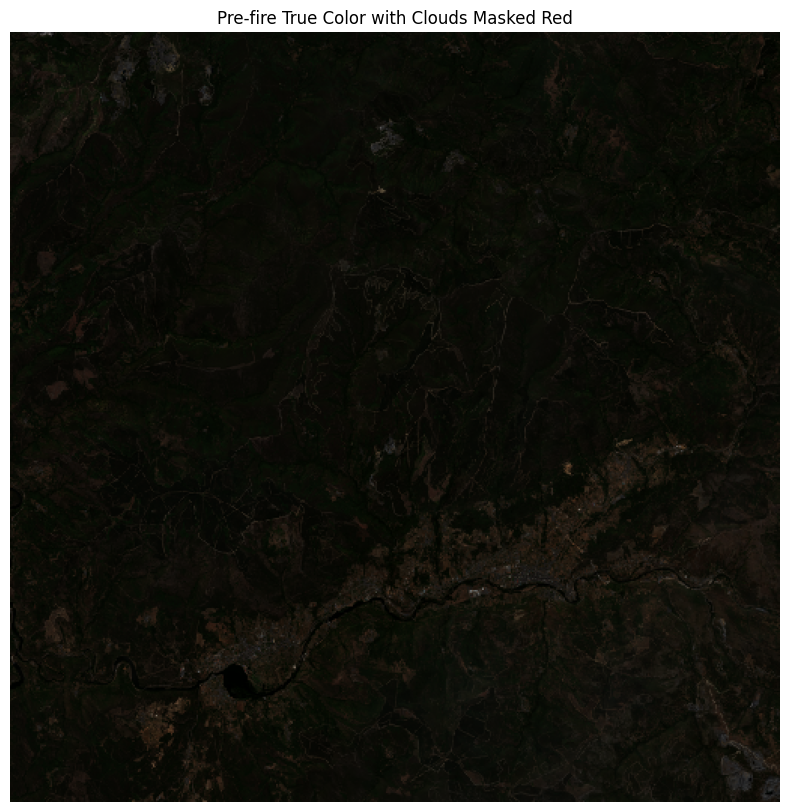

In [24]:
# -----------------------------
# Send request
# -----------------------------
response = oauth.post(url_request, headers=headers, json=json_request)

if response.status_code == 200:
    with MemoryFile(response.content) as memfile:
        with memfile.open() as dataset:
            data = dataset.read()  # shape: (bands, height, width)
            print("Bands loaded:", data.shape)

    # 0=B02, 1=B03, 2=B04, 3=SCL (masked as red in output)
    # For cloud % calculation, identify cloud pixels in 4th band (alpha mask)
    # define the RGB pattern for clouds
    cloud_rgb = np.array([1.0, 0.0, 0.0])  # red in evalscript

# compare each pixel: all bands match cloud_rgb
    cloud_mask = np.all(data[:3, :, :] == cloud_rgb[:, None, None], axis=0)
    cloud_percentage = 100 * np.mean(cloud_mask)
    print(f"AOI cloud cover: {cloud_percentage:.2f}%")

    # Build RGB for plotting (B04, B03, B02)
    rgb = np.stack([data[2], data[1], data[0]], axis=-1)
    rgb[cloud_mask] = np.nan
    rgb = np.clip(rgb, 0, 1)

    plt.figure(figsize=(10, 10))
    plt.imshow(rgb)
    plt.axis('off')
    plt.title("Pre-fire True Color with Clouds Masked Red")
    plt.show()
else:
    print("Request failed:", response.status_code, response.text)


In [ ]:
#No podemos descargar a traves de Process API porque las bandas tienen que estar en units REFLECTANCE, pero SCL (cloud masking) tiene que ser categórica

In [28]:
#Get an authentication token
token = oauth.fetch_token(
    token_url='https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token',
    client_secret=CLIENT_SECRET,
    include_client_id=True
)

In [87]:
#request body/payload
json_request = {
  "input": {
    "bounds": {
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              -7.220078,
              42.350425
            ],
            [
              -6.877441,
              42.350425
            ],
            [
              -6.877441,
              42.576344
            ],
            [
              -7.220078,
              42.576344
            ],
            [
              -7.220078,
              42.350425
            ]
          ]
        ]
      }
    },
    "data": [
      {
        "type": "sentinel-2-l2a",
        "dataFilter": {
          "timeRange": {
            "from": "2025-08-13T00:00:00Z",
            "to": "2025-08-13T23:59:59Z"
          }
        }
      }
    ]
  },
  "output": {
    "width": 512,
    "height": 512,
    "responses": [
      {
        "identifier": "default",
        "format": {
          "type": "image/tiff"
        }
      }
    ]
  },
"evalscript" : evalscript_cloud
}

In [88]:
#Set the request URL and headers
url_request = "https://sh.dataspace.copernicus.eu/api/v1/process"
headers = {
  "Authorization": f"Bearer {token['access_token']}"
}

Bands loaded: (7, 512, 512)
AOI cloud cover: 23.81%


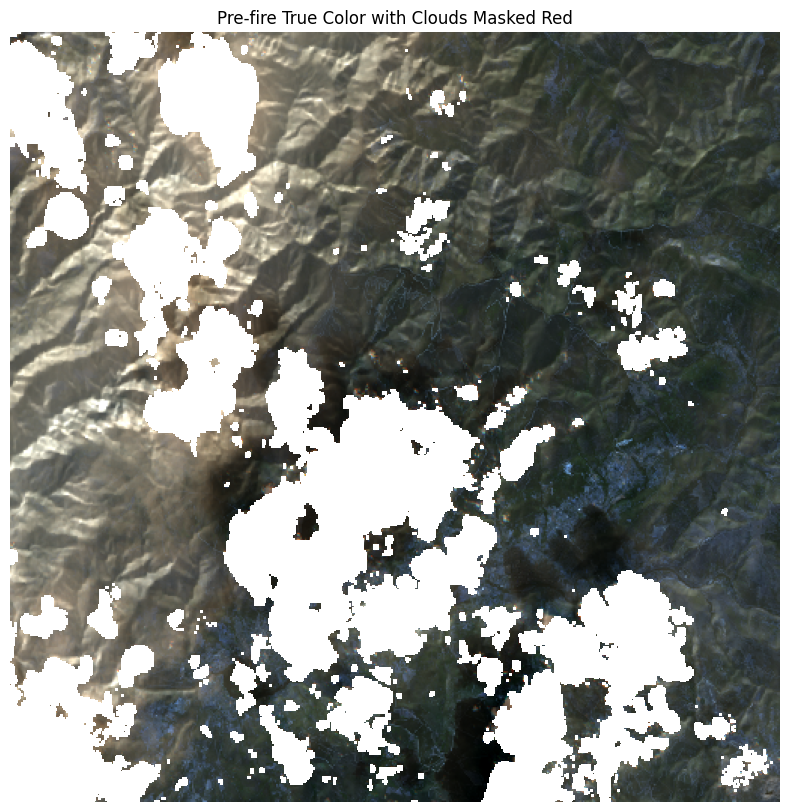

In [89]:
# -----------------------------
# Send request
# -----------------------------
response = oauth.post(url_request, headers=headers, json=json_request)

if response.status_code == 200:
    with MemoryFile(response.content) as memfile:
        with memfile.open() as dataset:
            data = dataset.read()  # shape: (bands, height, width)
            print("Bands loaded:", data.shape)

    # 0=B02, 1=B03, 2=B04, 3=SCL (masked as red in output)
    # For cloud % calculation, identify cloud pixels in 4th band (alpha mask)
    # define the RGB pattern for clouds
    cloud_rgb = np.array([1.0, 0.0, 0.0])  # red in evalscript

# compare each pixel: all bands match cloud_rgb
    cloud_mask = np.all(data[:3, :, :] == cloud_rgb[:, None, None], axis=0)
    cloud_percentage = 100 * np.mean(cloud_mask)
    print(f"AOI cloud cover: {cloud_percentage:.2f}%")

    # Build RGB for plotting (B04, B03, B02)
    rgb = np.stack([data[2], data[1], data[0]], axis=-1)
    rgb[cloud_mask] = np.nan
    rgb = np.clip(rgb, 0, 1)

    plt.figure(figsize=(10, 10))
    plt.imshow(rgb)
    plt.axis('off')
    plt.title("Pre-fire True Color with Clouds Masked Red")
    plt.show()
else:
    print("Request failed:", response.status_code, response.text)


# Post fire

In [106]:
#Get an authentication token
token = oauth.fetch_token(
    token_url='https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token',
    client_secret=CLIENT_SECRET,
    include_client_id=True
)

In [107]:
#Pre-fire params
bbox = [-7.220078, 42.350425, -6.877441, 42.576344] #[minLon, minLat, maxLon, maxLat]
post_fire_start_date = "2025-08-18"
post_fire_end_date = "2025-09-15"
collection_id = "sentinel-2-l2a"
post_fire_cloud = 20

In [108]:
catalog_url = "https://sh.dataspace.copernicus.eu/api/v1/catalog/1.0.0/search"
headers = {"Authorization": f"Bearer {token['access_token']}",
           "Content-Type": "application/json"}

json_search = {
    "bbox": bbox,
    "datetime": f"{post_fire_start_date}T00:00:00Z/{post_fire_end_date}T23:59:59Z",
    "collections": [collection_id],
    "limit": 50,
    "filter": f"eo:cloud_cover <= {post_fire_cloud}",
    "fields": {
        "include": [
            "id", 
            "properties.datetime", 
            "properties.eo:cloud_cover"
        ]
    }
}


In [109]:
#Set the request URL and headers
url_request = "https://sh.dataspace.copernicus.eu/api/v1/process"
headers = {
  "Authorization": f"Bearer {token['access_token']}"
}

In [110]:
response = oauth.post(catalog_url, headers=headers, json=json_search)

if response.status_code == 200:
    features = response.json().get("features", [])
    if features:
        features.sort(
            key=lambda f: f["properties"]["datetime"],
            reverse=True
        )
        
        print("Post-fire scenes with ≤ 20% cloud cover (newest first):")
        for f in features:
            date = f["properties"]["datetime"][:10]
            cloud = f["properties"].get("eo:cloud_cover", "N/A")
            
            # Check tile coverage
            tile_polygon = shape(f["geometry"])
            if aoi_polygon.within(tile_polygon):
                coverage_status = "Fully covers AOI"
            else:
                # Compute percent coverage
                intersection_area = aoi_polygon.intersection(tile_polygon).area
                aoi_area = aoi_polygon.area
                coverage_pct = 100 * intersection_area / aoi_area
                coverage_status = f"Partial coverage ({coverage_pct:.1f}%)"
            
            print(f"{date} | cloud: {cloud}% | id: {f['id']} | {coverage_status}")
            
    else:
        print("No scenes found with <= 20% clouds in this period/area")
else:
    print("Catalog error:", response.status_code, response.text)

Post-fire scenes with ≤ 20% cloud cover (newest first):
2025-09-15 | cloud: 12.08% | id: S2B_MSIL2A_20250915T112109_N0511_R037_T29TPG_20250915T140014.SAFE | Partial coverage (37.1%)
2025-09-05 | cloud: 4.81% | id: S2B_MSIL2A_20250905T112109_N0511_R037_T29TPG_20250905T133452.SAFE | Partial coverage (37.1%)
2025-09-05 | cloud: 6.2% | id: S2B_MSIL2A_20250905T112109_N0511_R037_T29TPH_20250905T133452.SAFE | Fully covers AOI
2025-08-26 | cloud: 0.04% | id: S2B_MSIL2A_20250826T112119_N0511_R037_T29TPG_20250826T133202.SAFE | Partial coverage (37.1%)
2025-08-26 | cloud: 12.09% | id: S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE | Fully covers AOI
2025-08-23 | cloud: 0.1% | id: S2A_MSIL2A_20250823T112131_N0511_R037_T29TPG_20250823T162957.SAFE | Partial coverage (37.1%)
2025-08-23 | cloud: 0.23% | id: S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957.SAFE | Fully covers AOI
2025-08-21 | cloud: 6.31% | id: S2C_MSIL2A_20250821T112131_N0511_R037_T29TPG_20250821T150517.

## Post-fire Selection

- 2025-09-05 | cloud: 6.2% | id: S2B_MSIL2A_20250905T112109_N0511_R037_T29TPH_20250905T133452.SAFE | Fully covers AOI
- 2025-08-26 | cloud: 12.09% | id: S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE | Fully covers AOI
- 2025-08-23 | cloud: 0.23% | id: S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957.SAFE | Fully covers AOI

## OData

Pre-fire

**1. Query OData with name filter for product_uuid**

https://catalogue.dataspace.copernicus.eu/odata/v1/Products?$filter=Name eq 'CATALOG_API_ID'&$select=Id,Name,ContentDate

product_uuid = Id

In [118]:
#For - 2025-08-11 | cloud: 3.15% | id: S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.SAFE | Fully covers AOI

#https://catalogue.dataspace.copernicus.eu/odata/v1/Products?$filter=Name eq 'S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.SAFE'&$select=Id,Name,ContentDate

product_uuid = "fd6d86a0-aaf7-4245-b938-3c190c046424"

In [119]:
#Get an authentication token
token = oauth.fetch_token(
    token_url='https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token',
    client_secret=CLIENT_SECRET,
    include_client_id=True
)

In [120]:
import requests
from tqdm import tqdm  # Optional: nice progress bar (pip install tqdm if needed)

access_token = token['access_token']

product_uuid = "fd6d86a0-aaf7-4245-b938-3c190c046424"
url = f"https://download.dataspace.copernicus.eu/odata/v1/Products({product_uuid})/$value"

headers = {"Authorization": f"Bearer {access_token}"}

session = requests.Session()
session.headers.update(headers)

try:
    response = session.get(url, stream=True, timeout=60)  # Add timeout to avoid hanging

    if response.status_code == 200:
        # Try to get original filename from Content-Disposition (often includes .zip name)
        content_disp = response.headers.get("Content-Disposition", "")
        filename = "product.zip"
        if "filename=" in content_disp:
            filename = content_disp.split("filename=")[-1].strip('"')

        total_size = int(response.headers.get("Content-Length", 0))  # For progress bar

        print(f"Downloading {filename} ({total_size / 1e9:.2f} GB)...")

        with open(filename, "wb") as file:
            if total_size > 0:
                # Progress bar with tqdm (optional but very useful)
                with tqdm(total=total_size, unit="B", unit_scale=True, desc=filename) as pbar:
                    for chunk in response.iter_content(chunk_size=8192):
                        if chunk:
                            file.write(chunk)
                            pbar.update(len(chunk))
            else:
                # Fallback without size info
                for chunk in response.iter_content(chunk_size=8192):
                    if chunk:
                        file.write(chunk)

        print(f"Download complete: {filename}")
    else:
        print(f"Failed to download. Status: {response.status_code}")
        print(response.text[:500])  # Limit output in case it's huge error HTML

except requests.exceptions.RequestException as e:
    print(f"Request error: {e}")
except Exception as e:
    print(f"Unexpected error: {e}")
finally:
    session.close()  # Good hygiene

S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.zip: 100%|██████████| 1.22G/1.22G [08:27<00:00, 2.41MB/s]

Download complete: S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.zip


RGB shape: (5490, 5490, 3)
Masked 4.8% as cloud/shadow/cirrus


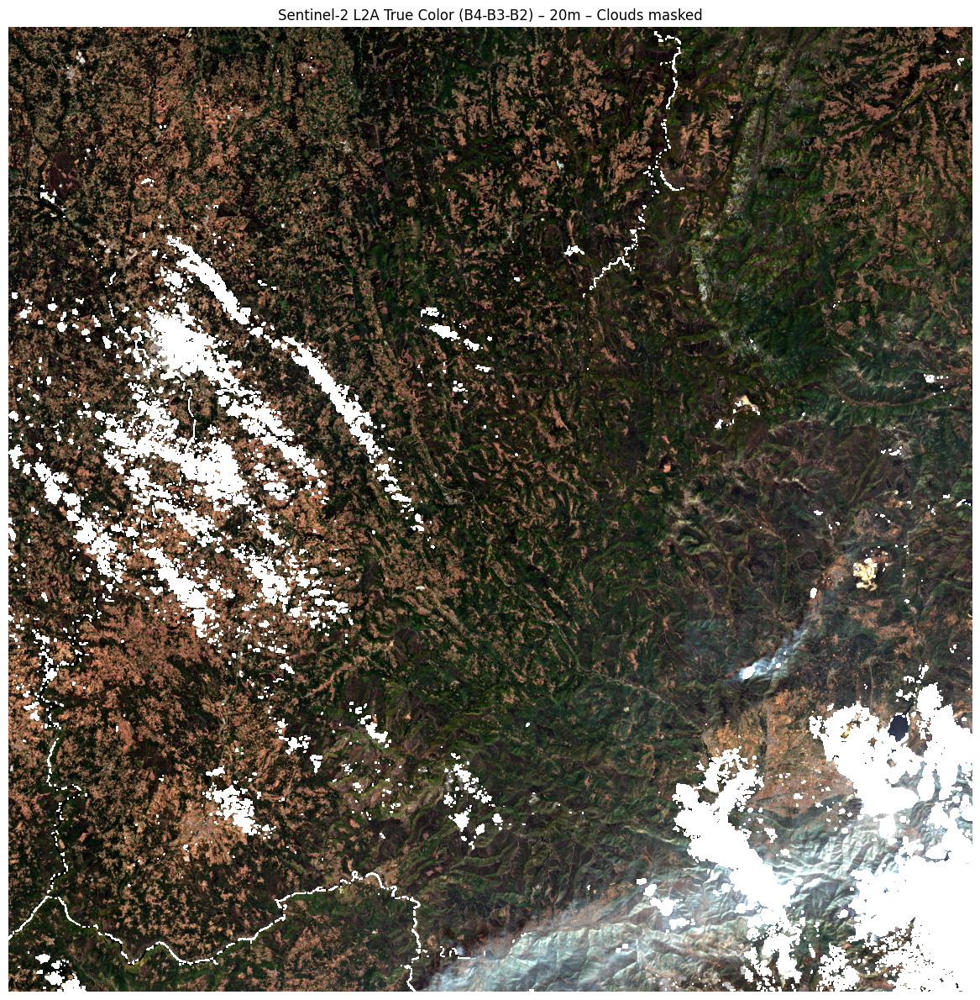

In [121]:
#Check
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Adjust this path to your actual folder
base_path = Path(r"C:\Projects\A-1\S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216"
                 r"\S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.SAFE"
                 r"\GRANULE\L2A_T29TPH_A004869_20250811T112403\IMG_DATA\R20m")

# Band file patterns (20m resolution)
b02_path = base_path / "T29TPH_20250811T112131_B02_20m.jp2"   # Blue
b03_path = base_path / "T29TPH_20250811T112131_B03_20m.jp2"   # Green
b04_path = base_path / "T29TPH_20250811T112131_B04_20m.jp2"   # Red
scl_path = base_path / "T29TPH_20250811T112131_SCL_20m.jp2"   # Scene Classification (optional)

# Function to read and normalize one band (uint16 → float 0-1 with stretch)
def read_and_stretch(band_path):
    with rasterio.open(band_path) as src:
        band = src.read(1).astype(np.float32)  # read band 1
        profile = src.profile
        # Simple linear stretch: 2–98 percentiles
        p2, p98 = np.percentile(band[band > 0], (2, 98))  # ignore nodata ~0
        band = np.clip((band - p2) / (p98 - p2), 0, 1)
    return band, profile

# Load RGB bands
blue,  _ = read_and_stretch(b02_path)
green, _ = read_and_stretch(b03_path)
red,   _ = read_and_stretch(b04_path)

# Stack to RGB (height, width, 3)
rgb = np.dstack([red, green, blue])

print("RGB shape:", rgb.shape)

# Optional: Load SCL and create cloud/shadow mask
# SCL classes (from Sen2Cor docs):
#   4 = Vegetation, 5 = Bare soils, 6 = Water, 7 = Low cloud, 8 = Med cloud, 9 = High cloud,
#   10 = Thin cirrus, 11 = Snow/ice
cloud_shadow_classes = [3, 7, 8, 9, 10]  # cloud + cirrus + shadow (adjust as needed)

if scl_path.exists():
    with rasterio.open(scl_path) as src_scl:
        scl = src_scl.read(1)
    mask = np.isin(scl, cloud_shadow_classes)
    rgb[mask] = np.nan  # or [1,0,0] for red highlight
    print(f"Masked {np.sum(mask)/mask.size*100:.1f}% as cloud/shadow/cirrus")

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(rgb)
ax.set_title("Sentinel-2 L2A True Color (B4-B3-B2) – 20m – Clouds masked")
ax.axis('off')
plt.tight_layout()
plt.show()

# Optional: Zoom on a sub-area (e.g. your AOI bbox if you have coords)
# Example: ax.imshow(rgb[1000:2000, 1500:2500, :])  # adjust row/col slices

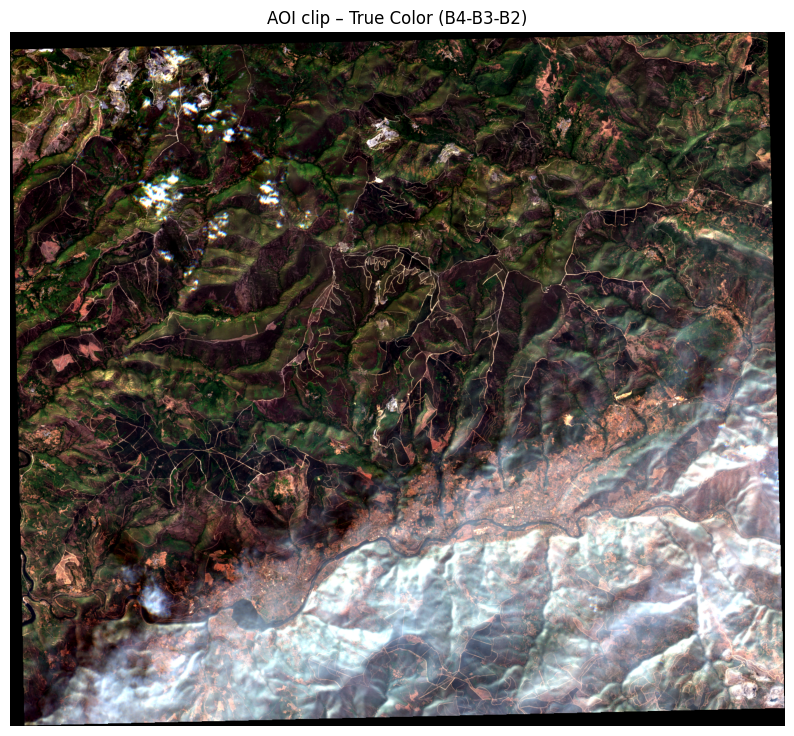

In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import mapping

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file("data/aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216" \
       r"\S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE" \
       r"\GRANULE\L2A_T29TPH_A004869_20250811T112403\IMG_DATA\R20m"

b04_path = f"{base}\\T29TPH_20250811T112131_B04_20m.jp2"  # Red
b03_path = f"{base}\\T29TPH_20250811T112131_B03_20m.jp2"  # Green
b02_path = f"{base}\\T29TPH_20250811T112131_B02_20m.jp2"  # Blue

# 3. Read & clip all three bands at once
def read_clip_rgb(red_path, green_path, blue_path, geometries):
    with rasterio.open(red_path) as src_red:
        red_clip, transform = mask(src_red, geometries, crop=True, nodata=0)
        red_clip = red_clip[0].astype(np.float32)  # remove singleton dim

    with rasterio.open(green_path) as src_green:
        green_clip, _ = mask(src_green, geometries, crop=True, nodata=0)
        green_clip = green_clip[0].astype(np.float32)

    with rasterio.open(blue_path) as src_blue:
        blue_clip, _ = mask(src_blue, geometries, crop=True, nodata=0)
        blue_clip = blue_clip[0].astype(np.float32)

    # Simple percentile stretch
    for arr in [red_clip, green_clip, blue_clip]:
        p2, p98 = np.percentile(arr[arr > 0], (2, 98))
        arr[:] = np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)

    rgb = np.dstack([red_clip, green_clip, blue_clip])
    return rgb, transform

rgb_clipped, transform = read_clip_rgb(b04_path, b03_path, b02_path, [mapping(g) for g in aoi_geom])

# 4. Plot
plt.figure(figsize=(10, 10))
plt.imshow(rgb_clipped)
plt.title("AOI clip – True Color (B4-B3-B2)")
plt.axis('off')
plt.show()

In [124]:
#For - 2025-08-01 | cloud: 10.71% | id: S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE | Fully covers AOI

#https://catalogue.dataspace.copernicus.eu/odata/v1/Products?$filter=Name eq 'S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE'&$select=Id,Name,ContentDate
product_uuid = "b3fa82b8-d62d-442b-8b6e-c21b709d6072"

In [136]:
#Get an authentication token
token = oauth.fetch_token(
    token_url='https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token',
    client_secret=CLIENT_SECRET,
    include_client_id=True
)

In [126]:
import requests
from tqdm import tqdm  # Optional: nice progress bar (pip install tqdm if needed)

access_token = token['access_token']

url = f"https://download.dataspace.copernicus.eu/odata/v1/Products({product_uuid})/$value"

headers = {"Authorization": f"Bearer {access_token}"}

session = requests.Session()
session.headers.update(headers)

try:
    response = session.get(url, stream=True, timeout=60)  # Add timeout to avoid hanging

    if response.status_code == 200:
        # Try to get original filename from Content-Disposition (often includes .zip name)
        content_disp = response.headers.get("Content-Disposition", "")
        filename = "product.zip"
        if "filename=" in content_disp:
            filename = content_disp.split("filename=")[-1].strip('"')

        total_size = int(response.headers.get("Content-Length", 0))  # For progress bar

        print(f"Downloading {filename} ({total_size / 1e9:.2f} GB)...")

        with open(filename, "wb") as file:
            if total_size > 0:
                # Progress bar with tqdm (optional but very useful)
                with tqdm(total=total_size, unit="B", unit_scale=True, desc=filename) as pbar:
                    for chunk in response.iter_content(chunk_size=8192):
                        if chunk:
                            file.write(chunk)
                            pbar.update(len(chunk))
            else:
                # Fallback without size info
                for chunk in response.iter_content(chunk_size=8192):
                    if chunk:
                        file.write(chunk)

        print(f"Download complete: {filename}")
    else:
        print(f"Failed to download. Status: {response.status_code}")
        print(response.text[:500])  # Limit output in case it's huge error HTML

except requests.exceptions.RequestException as e:
    print(f"Request error: {e}")
except Exception as e:
    print(f"Unexpected error: {e}")
finally:
    session.close()  # Good hygiene

S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.zip: 100%|██████████| 1.20G/1.20G [04:21<00:00, 4.58MB/s] 

Download complete: S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.zip


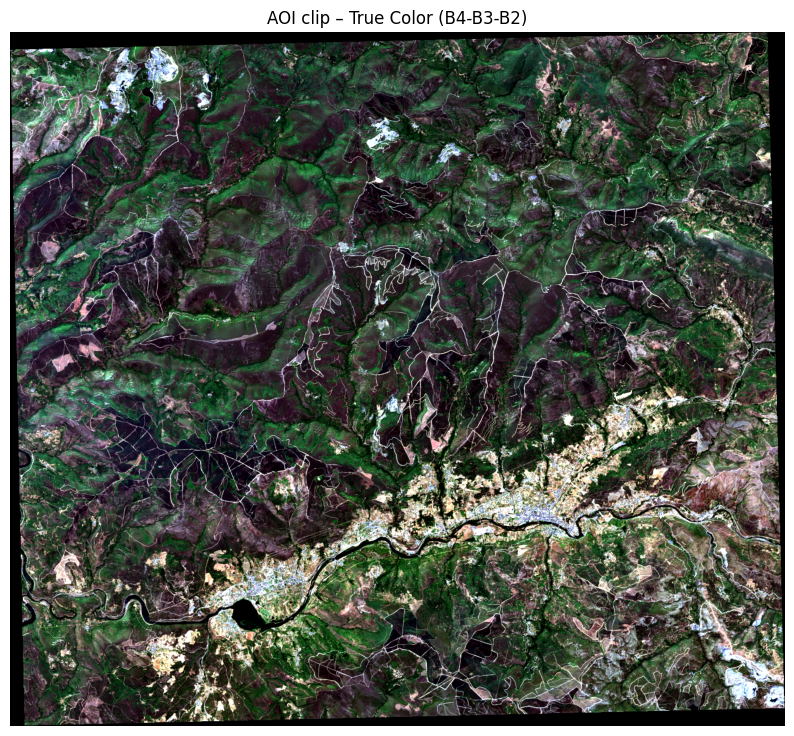

In [25]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import mapping

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file(r"C:\\Projects\A-1\data\aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\pre_fire\S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406" \
       r"\S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE" \
       r"\GRANULE\L2A_T29TPH_A004726_20250801T112807\IMG_DATA\R20m"

b04_path = f"{base}\\T29TPH_20250801T112131_B04_20m.jp2"  # Red
b03_path = f"{base}\\T29TPH_20250801T112131_B03_20m.jp2"  # Green
b02_path = f"{base}\\T29TPH_20250801T112131_B02_20m.jp2"  # Blue

# 3. Read & clip all three bands at once
def read_clip_rgb(red_path, green_path, blue_path, geometries):
    with rasterio.open(red_path) as src_red:
        red_clip, transform = mask(src_red, geometries, crop=True, nodata=0)
        red_clip = red_clip[0].astype(np.float32)  # remove singleton dim

    with rasterio.open(green_path) as src_green:
        green_clip, _ = mask(src_green, geometries, crop=True, nodata=0)
        green_clip = green_clip[0].astype(np.float32)

    with rasterio.open(blue_path) as src_blue:
        blue_clip, _ = mask(src_blue, geometries, crop=True, nodata=0)
        blue_clip = blue_clip[0].astype(np.float32)

    # Simple percentile stretch
    for arr in [red_clip, green_clip, blue_clip]:
        p2, p98 = np.percentile(arr[arr > 0], (2, 98))
        arr[:] = np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)

    rgb = np.dstack([red_clip, green_clip, blue_clip])
    return rgb, transform

rgb_clipped, transform = read_clip_rgb(b04_path, b03_path, b02_path, [mapping(g) for g in aoi_geom])

# 4. Plot
plt.figure(figsize=(10, 10))
plt.imshow(rgb_clipped)
plt.title("AOI clip – True Color (B4-B3-B2)")
plt.axis('off')
plt.show()

In [ ]:
#Clip

import rasterio
from rasterio.mask import mask
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import mapping
import os

out_dir = r"C:\Projects\A-1\data\output"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file("data/aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\\Projects\A-1\data\pre_fire\S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406" \
       r"\S2C_MSIL2A_20250801T112131_N0511_R037_T29TPH_20250801T154406.SAFE" \
       r"\GRANULE\L2A_T29TPH_A004726_20250801T112807\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250801T112131_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250801T112131_B12_20m.jp2"  # swir2

def read_clip_nir_swir2(b8A_path, b12_path, geometries):
    with rasterio.open(b8A_path) as src_nir:
        nir_clip, transform = mask(src_nir, geometries, crop=True, nodata=0)
        nir_clip = nir_clip[0].astype(np.float32)
        meta = src_nir.meta.copy()

    with rasterio.open(b12_path) as src_swir2:
        swir2_clip, _ = mask(src_swir2, geometries, crop=True, nodata=0)
        swir2_clip = swir2_clip[0].astype(np.float32)

    # Percentile stretch
    for arr in [nir_clip, swir2_clip]:
        valid = arr > 0
        p2, p98 = np.percentile(arr[valid], (2, 98))
        arr[:] = np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)

    stacked = np.stack([nir_clip, swir2_clip])  # (bands, rows, cols)

    meta.update({
        "driver": "GTiff",
        "height": stacked.shape[1],
        "width": stacked.shape[2],
        "count": 2,
        "dtype": "float32",
        "transform": transform,
        "nodata": 0
    })

    return stacked, meta

In [15]:
nir_swir_clipped_prefire, meta = read_clip_nir_swir2(
    b8A_path,
    b12_path,
    [mapping(g) for g in aoi_geom]
)

with rasterio.open(out_path, "w", **meta) as dst:
    dst.write(nir_swir_clipped_prefire)

print(f"Saved clipped raster to: {out_path}")

Saved clipped raster to: C:\Projects\A-1\data\output\nir_swir2_clip.tif


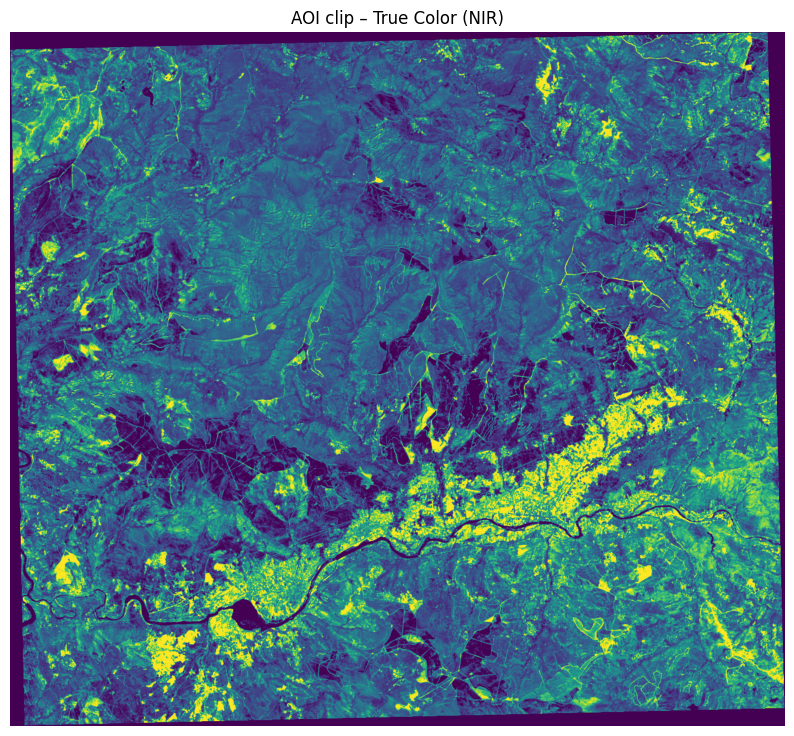

In [17]:
# 4. Plot
plt.figure(figsize=(10, 10))
plt.imshow(nir_swir_clipped[1])
plt.title("AOI clip – True Color (NIR)")
plt.axis('off')
plt.show()

In [29]:
import requests
import time

#- 2025-09-05 | cloud: 6.2% | id: S2B_MSIL2A_20250905T112109_N0511_R037_T29TPH_20250905T133452.SAFE | Fully covers AOI
#- 2025-08-26 | cloud: 12.09% | id: S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE | Fully covers AOI
#- 2025-08-23 | cloud: 0.23% | id: S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957.SAFE | Fully covers AOI

# Your token (from auth flow — do NOT hardcode in production!)
token = token['access_token']  # refresh this if expired

# List of SAFE names (your three scenes)
#"S2B_MSIL2A_20250905T112109_N0511_R037_T29TPH_20250905T133452.SAFE",
#"S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957.SAFE"
safe_names = [
    "S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE",
    "S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE",
    "S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE",
    
    # add the others...
]

uuids = {}

headers = {"Authorization": f"Bearer {token}"}

for safe_name in safe_names:
    url = f"https://catalogue.dataspace.copernicus.eu/odata/v1/Products?$filter=Name eq '{safe_name}'&$select=Id,Name"
    
    try:
        resp = requests.get(url, headers=headers, timeout=30)
        
        if resp.status_code == 200:
            data = resp.json().get("value", [])
            if data:
                uuid = data[0]["Id"]
                uuids[safe_name] = uuid
                print(f"UUID for {safe_name}: {uuid}")
            else:
                print(f"No product found for {safe_name}")
        elif resp.status_code == 401:
            print("Token expired or invalid → need to refresh/re-authenticate")
            # Here you would call your refresh or login function
            # For example: token = refresh_token_function()
            # Then update headers = {"Authorization": f"Bearer {token}"}
            break  # or continue with retry logic
        else:
            print(f"Error {resp.status_code} for {safe_name}: {resp.text[:200]}")
            
    except requests.exceptions.RequestException as e:
        print(f"Request failed for {safe_name}: {e}")
    
    # Small delay to be polite to the API (optional but good habit)
    time.sleep(1)

# After loop: you have uuids dict → use for downloads
print("\nCollected UUIDs:", uuids)

UUID for S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE: 752c18b6-a580-4c00-b4ef-3e4d27eb41d7
UUID for S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE: 9f8947a2-4549-484d-a36b-e724fa3057e7
UUID for S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE: 61c82788-8b46-4a20-8d5e-1a931e60f5b0

Collected UUIDs: {'S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE': '752c18b6-a580-4c00-b4ef-3e4d27eb41d7', 'S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE': '9f8947a2-4549-484d-a36b-e724fa3057e7', 'S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE': '61c82788-8b46-4a20-8d5e-1a931e60f5b0'}


In [34]:
import requests
from tqdm import tqdm
import time

# Your access token (reuse the same one - it's fine as explained before)
access_token = token['access_token']  # refresh this if expired

headers = {"Authorization": f"Bearer {access_token}"}

for safe_name, uuid in uuids.items():
    url = f"https://download.dataspace.copernicus.eu/odata/v1/Products({uuid})/$value"
    
    print(f"\nStarting download for: {safe_name}")
    print(f"URL: {url}")
    
    session = requests.Session()
    session.headers.update(headers)
    
    try:
        response = session.get(url, stream=True, timeout=60)
        
        if response.status_code == 200:
            # Get suggested filename from headers (usually SAFE_name.zip)
            content_disp = response.headers.get("Content-Disposition", "")
            filename = f"{safe_name}.zip"  # fallback
            if "filename=" in content_disp:
                filename = content_disp.split("filename=")[-1].strip('"')
            
            # Optional: make filename safer / unique
            filename = filename.replace(".SAFE", "").replace(" ", "_") + ".zip"
            
            total_size = int(response.headers.get("Content-Length", 0))
            print(f"Downloading → {filename} ({total_size / 1e9:.2f} GB)")
            
            with open(filename, "wb") as file:
                if total_size > 0:
                    with tqdm(
                        total=total_size,
                        unit="B",
                        unit_scale=True,
                        unit_divisor=1024,
                        desc=safe_name[:30] + "..." if len(safe_name) > 30 else safe_name
                    ) as pbar:
                        for chunk in response.iter_content(chunk_size=8192):
                            if chunk:
                                file.write(chunk)
                                pbar.update(len(chunk))
                else:
                    # Rare case: no Content-Length
                    for chunk in response.iter_content(chunk_size=8192):
                        if chunk:
                            file.write(chunk)
            
            print(f"Download complete: {filename}")
        
        elif response.status_code == 401:
            print("→ 401 Unauthorized: Token likely expired. Refresh it and retry.")
            # Insert your token refresh code here if implemented
            break  # or continue with manual intervention
        
        else:
            print(f"Failed → Status: {response.status_code}")
            print(response.text[:400])  # truncated error
        
    except requests.exceptions.RequestException as e:
        print(f"Network/request error for {safe_name}: {e}")
    
    except Exception as e:
        print(f"Unexpected error for {safe_name}: {e}")
    
    finally:
        session.close()
    
    # Polite delay between large downloads (helps avoid rate limits)
    time.sleep(5)  # adjust as needed (or remove if downloading only 3 scenes)

print("\nAll downloads attempted.")


Starting download for: S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE
URL: https://download.dataspace.copernicus.eu/odata/v1/Products(752c18b6-a580-4c00-b4ef-3e4d27eb41d7)/$value


S2B_MSIL2A_20250806T112119_N05...: 100%|██████████| 1.14G/1.14G [07:35<00:00, 2.69MB/s]


Download complete: S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.zip.zip

Starting download for: S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE
URL: https://download.dataspace.copernicus.eu/odata/v1/Products(9f8947a2-4549-484d-a36b-e724fa3057e7)/$value


S2A_MSIL2A_20250813T112131_N05...: 100%|██████████| 1.11G/1.11G [07:58<00:00, 2.50MB/s]


Download complete: S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.zip.zip

Starting download for: S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE
URL: https://download.dataspace.copernicus.eu/odata/v1/Products(61c82788-8b46-4a20-8d5e-1a931e60f5b0)/$value


S2B_MSIL2A_20250826T112119_N05...: 100%|██████████| 1.12G/1.12G [11:19<00:00, 1.76MB/s]


Download complete: S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.zip.zip

All downloads attempted.


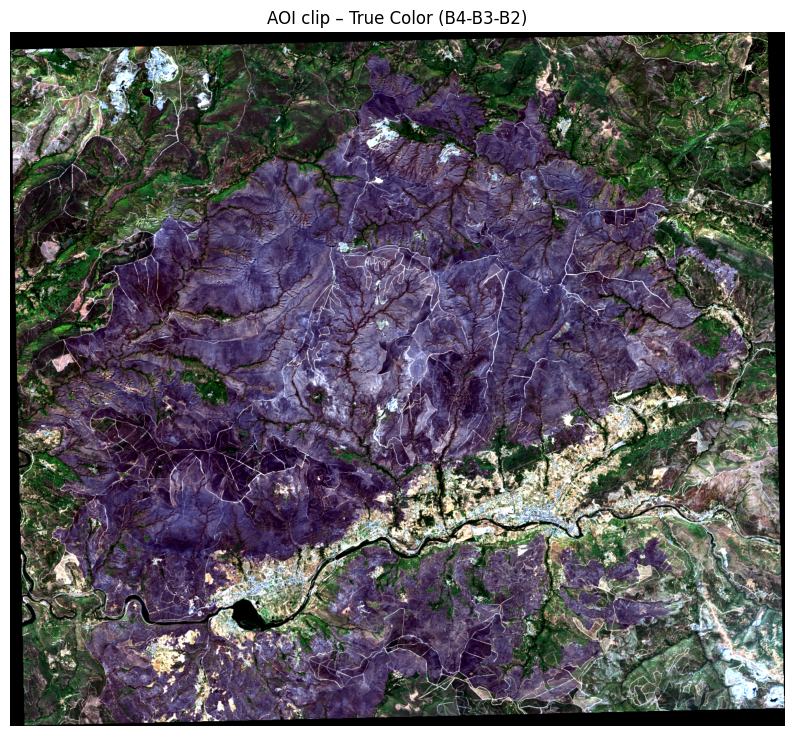

In [138]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import mapping

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file("data/aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957" \
       r"\S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957.SAFE" \
       r"\GRANULE\L2A_T29TPH_A053116_20250823T112630\IMG_DATA\R20m"

b04_path = f"{base}\\T29TPH_20250823T112131_B04_20m.jp2"  # Red
b03_path = f"{base}\\T29TPH_20250823T112131_B03_20m.jp2"  # Green
b02_path = f"{base}\\T29TPH_20250823T112131_B02_20m.jp2"  # Blue

# 3. Read & clip all three bands at once
def read_clip_rgb(red_path, green_path, blue_path, geometries):
    with rasterio.open(red_path) as src_red:
        red_clip, transform = mask(src_red, geometries, crop=True, nodata=0)
        red_clip = red_clip[0].astype(np.float32)  # remove singleton dim

    with rasterio.open(green_path) as src_green:
        green_clip, _ = mask(src_green, geometries, crop=True, nodata=0)
        green_clip = green_clip[0].astype(np.float32)

    with rasterio.open(blue_path) as src_blue:
        blue_clip, _ = mask(src_blue, geometries, crop=True, nodata=0)
        blue_clip = blue_clip[0].astype(np.float32)

    # Simple percentile stretch
    for arr in [red_clip, green_clip, blue_clip]:
        p2, p98 = np.percentile(arr[arr > 0], (2, 98))
        arr[:] = np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)

    rgb = np.dstack([red_clip, green_clip, blue_clip])
    return rgb, transform

rgb_clipped, transform = read_clip_rgb(b04_path, b03_path, b02_path, [mapping(g) for g in aoi_geom])

# 4. Plot
plt.figure(figsize=(10, 10))
plt.imshow(rgb_clipped)
plt.title("AOI clip – True Color (B4-B3-B2)")
plt.axis('off')
plt.show()

In [ ]:
#Clip

import rasterio
from rasterio.mask import mask
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import mapping
import os

out_dir = r"C:\Projects\A-1\data\output"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip_postfire.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file("data/aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\postfire\S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957" \
       r"\S2A_MSIL2A_20250823T112131_N0511_R037_T29TPH_20250823T162957.SAFE" \
       r"\GRANULE\L2A_T29TPH_A053116_20250823T112630\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250823T112131_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250823T112131_B12_20m.jp2"  # swir2

def read_clip_nir_swir2(b8A_path, b12_path, geometries):
    with rasterio.open(b8A_path) as src_nir:
        nir_clip, transform = mask(src_nir, geometries, crop=True, nodata=0)
        nir_clip = nir_clip[0].astype(np.float32)
        meta = src_nir.meta.copy()

    with rasterio.open(b12_path) as src_swir2:
        swir2_clip, _ = mask(src_swir2, geometries, crop=True, nodata=0)
        swir2_clip = swir2_clip[0].astype(np.float32)

    # Percentile stretch
    for arr in [nir_clip, swir2_clip]:
        valid = arr > 0
        p2, p98 = np.percentile(arr[valid], (2, 98))
        arr[:] = np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)

    stacked = np.stack([nir_clip, swir2_clip])  # (bands, rows, cols)

    meta.update({
        "driver": "GTiff",
        "height": stacked.shape[1],
        "width": stacked.shape[2],
        "count": 2,
        "dtype": "float32",
        "transform": transform,
        "nodata": 0
    })

    return stacked, meta

In [3]:
def read_clip_nir_swir2(b8A_path, b12_path, geometries):
    with rasterio.open(b8A_path) as src_nir:
        nir_clip, transform = mask(src_nir, geometries, crop=True, nodata=0)
        nir_clip = nir_clip[0].astype(np.float32)
        meta = src_nir.meta.copy()

    with rasterio.open(b12_path) as src_swir2:
        swir2_clip, _ = mask(src_swir2, geometries, crop=True, nodata=0)
        swir2_clip = swir2_clip[0].astype(np.float32)

    # Percentile stretch
    for arr in [nir_clip, swir2_clip]:
        valid = arr > 0
        p2, p98 = np.percentile(arr[valid], (2, 98))
        arr[:] = np.clip((arr - p2) / (p98 - p2 + 1e-6), 0, 1)

    stacked = np.stack([nir_clip, swir2_clip])  # (bands, rows, cols)

    meta.update({
        "driver": "GTiff",
        "height": stacked.shape[1],
        "width": stacked.shape[2],
        "count": 2,
        "dtype": "float32",
        "transform": transform,
        "nodata": 0
    })

    return stacked, meta

In [7]:
#13-08-25

#Clip

import rasterio
from rasterio.mask import mask
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import mapping
import os

out_dir = r"C:\Projects\A-1\output\prefire\13-08-25"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip_prefire_13_08_25.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file(r"C:\Projects\A-1\data\aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\pre_fire\S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722" \
       r"\S2A_MSIL2A_20250813T112131_N0511_R037_T29TPH_20250813T160722.SAFE" \
       r"\GRANULE\L2A_T29TPH_A052973_20250813T112744\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250813T112131_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250813T112131_B12_20m.jp2"  # swir2

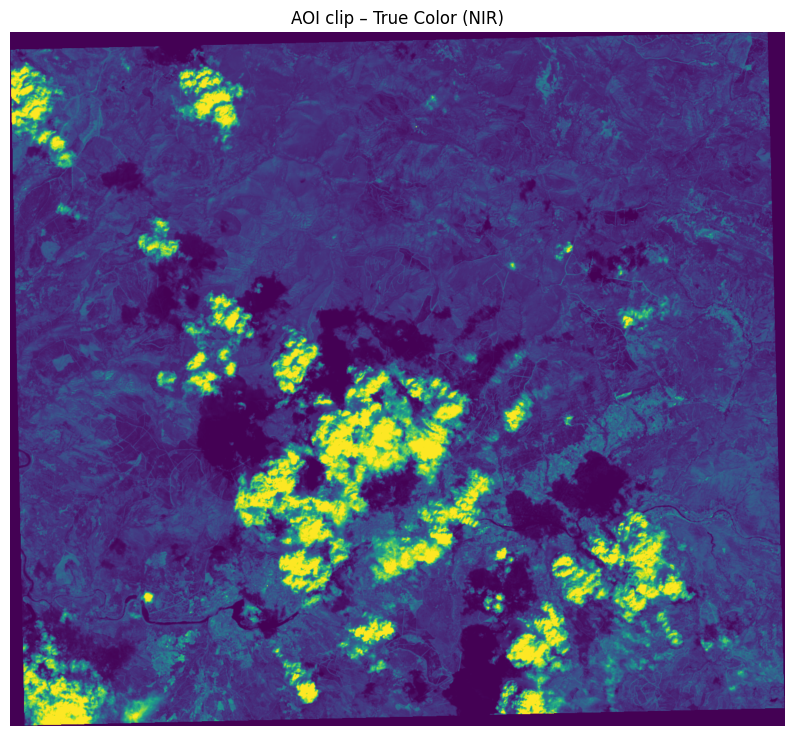

In [ ]:
nir_swir_clipped_prefire, meta = read_clip_nir_swir2(
    b8A_path,
    b12_path,
    [mapping(g) for g in aoi_geom]
)

with rasterio.open(out_path, "w", **meta) as dst:
    dst.write(nir_swir_clipped_prefire)

print(f"Saved clipped raster to: {out_path}")

In [ ]:
#11-08-25

out_dir = r"C:\Projects\A-1\output\prefire\11-08-25"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip_prefire_11_08_25.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file(r"C:\Projects\A-1\data\aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:4326":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\pre_fire\S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216" \
       r"\S2C_MSIL2A_20250811T112131_N0511_R037_T29TPH_20250811T152216.SAFE" \
       r"\GRANULE\L2A_T29TPH_A004869_20250811T112403\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250811T112131_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250811T112131_B12_20m.jp2"  # swir2

In [44]:
nir_swir_clipped_prefire, meta = read_clip_nir_swir2(
    b8A_path,
    b12_path,
    [mapping(g) for g in aoi_geom]
)

with rasterio.open(out_path, "w", **meta) as dst:
    dst.write(nir_swir_clipped_prefire)

print(f"Saved clipped raster to: {out_path}")

Saved clipped raster to: C:\Projects\A-1\output\prefire\11-08-25\nir_swir2_clip_prefire_11_08_25.tif


In [ ]:
#06-08-25

#Clip

out_dir = r"C:\Projects\A-1\output\prefire\06-08-25"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip_prefire_06_08_25.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file(r"C:\Projects\A-1\data\aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:4326":
    aoi_gdf = aoi_gdf.to_crs("EPSG:4326")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\pre_fire\S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603" \
       r"\S2B_MSIL2A_20250806T112119_N0511_R037_T29TPH_20250806T140603.SAFE" \
       r"\GRANULE\L2A_T29TPH_A043964_20250806T112251\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250806T112119_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250806T112119_B12_20m.jp2"  # swir2


In [49]:
nir_swir_clipped_prefire, meta = read_clip_nir_swir2(
    b8A_path,
    b12_path,
    [mapping(g) for g in aoi_geom]
)

with rasterio.open(out_path, "w", **meta) as dst:
    dst.write(nir_swir_clipped_prefire)

print(f"Saved clipped raster to: {out_path}")

Saved clipped raster to: C:\Projects\A-1\output\prefire\06-08-25\nir_swir2_clip_prefire_06_08_25.tif


In [50]:
#26-08-25

#Clip

out_dir = r"C:\Projects\A-1\output\postfire\26-08-25"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip_postfire_26_08_25.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file(r"C:\Projects\A-1\data\aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\postfire\S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202" \
       r"\S2B_MSIL2A_20250826T112119_N0511_R037_T29TPH_20250826T133202.SAFE" \
       r"\GRANULE\L2A_T29TPH_A044250_20250826T112114\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250826T112119_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250826T112119_B12_20m.jp2"  # swir2

nir_swir_clipped_postfire, meta = read_clip_nir_swir2(
    b8A_path,
    b12_path,
    [mapping(g) for g in aoi_geom]
)

with rasterio.open(out_path, "w", **meta) as dst:
    dst.write(nir_swir_clipped_postfire)

print(f"Saved clipped raster to: {out_path}")

Saved clipped raster to: C:\Projects\A-1\output\postfire\26-08-25\nir_swir2_clip_postfire_26_08_25.tif


In [51]:
#05-09-25

#Clip

out_dir = r"C:\Projects\A-1\output\postfire\05-09-25"
os.makedirs(out_dir, exist_ok=True)

out_path = os.path.join(out_dir, "nir_swir2_clip_postfire_05_09_25.tif")

# 1. Load your AOI geometry
aoi_gdf = gpd.read_file(r"C:\Projects\A-1\data\aoi.geojson")           # or your existing GeoDataFrame
aoi_geom = aoi_gdf.geometry.values               # list of shapely geometries

# Make sure CRS matches the Sentinel-2 tile (usually EPSG:32629 for T29TPH)
# If not, reproject:
if aoi_gdf.crs != "EPSG:32629":
    aoi_gdf = aoi_gdf.to_crs("EPSG:32629")
    aoi_geom = aoi_gdf.geometry.values

# 2. Paths to the three bands (20 m)
base = r"C:\Projects\A-1\data\postfire\S2B_MSIL2A_20250905T112109_N0511_R037_T29TPH_20250905T133452" \
       r"\S2B_MSIL2A_20250905T112109_N0511_R037_T29TPH_20250905T133452.SAFE" \
       r"\GRANULE\L2A_T29TPH_A044393_20250905T112112\IMG_DATA\R20m"

b8A_path = f"{base}\\T29TPH_20250905T112109_B8A_20m.jp2"  # nir
b12_path = f"{base}\\T29TPH_20250905T112109_B12_20m.jp2"  # swir2

nir_swir_clipped_postfire, meta = read_clip_nir_swir2(
    b8A_path,
    b12_path,
    [mapping(g) for g in aoi_geom]
)

with rasterio.open(out_path, "w", **meta) as dst:
    dst.write(nir_swir_clipped_postfire)

print(f"Saved clipped raster to: {out_path}")

Saved clipped raster to: C:\Projects\A-1\output\postfire\05-09-25\nir_swir2_clip_postfire_05_09_25.tif
